In [1]:
import torch
import torch.nn as nn
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

**`set the parameters`**

In [2]:
# Set random seed for reproducibility
manualSeed = 999

#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

# Batch size during training
batch_size = 16  ## Hiếu: {32, 64, 16} (epochs = 20)

# Spatial size of training images. All images will be resized to this size using a transformer.
image_size = 64 

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs (mai thử = 300, std = 0.)
num_epochs = 10   

# Learning rate for optimizers
lr = 0.00025       

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# number of workers
workers = 3

## Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

Random Seed:  999


Load the dataset

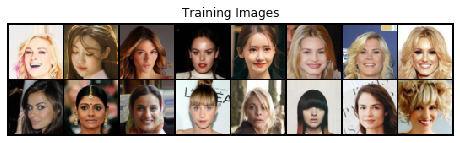

In [3]:
new_dir_ = r"D:\Nhan\Faces\girl_face"

# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root = new_dir_,
                           transform = transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size = batch_size,
                                         shuffle = True, num_workers=workers)

## Plot the grid of images
real_batch = next(iter(dataloader))
plt.figure(figsize = (8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding = 2, normalize = True).cpu(), (1, 2, 0)))

In [4]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator Code
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
    
## Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

## Generator-process 
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)    
##
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [5]:
## Loss_function & Optimize
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
lr_D, lr_G = 0.00018, 0.00022
optimizerD = optim.Adam(netD.parameters(), lr=lr_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr_G, betas=(beta1, 0.999))

## Training
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

Starting Training Loop...
[0/10][0/438]	Loss_D: 1.4628	Loss_G: 6.1739	D(x): 0.5751	D(G(z)): 0.5146 / 0.0027
[0/10][50/438]	Loss_D: 0.7316	Loss_G: 15.2782	D(x): 0.8891	D(G(z)): 0.2858 / 0.0000
[0/10][100/438]	Loss_D: 1.0700	Loss_G: 17.2787	D(x): 0.6996	D(G(z)): 0.0000 / 0.0000
[0/10][150/438]	Loss_D: 0.0263	Loss_G: 7.0860	D(x): 0.9815	D(G(z)): 0.0059 / 0.0044
[0/10][200/438]	Loss_D: 0.4471	Loss_G: 5.9503	D(x): 0.8575	D(G(z)): 0.2175 / 0.0085
[0/10][250/438]	Loss_D: 0.5050	Loss_G: 6.0155	D(x): 0.7362	D(G(z)): 0.0717 / 0.0092
[0/10][300/438]	Loss_D: 0.7543	Loss_G: 5.6472	D(x): 0.6855	D(G(z)): 0.1672 / 0.0083
[0/10][350/438]	Loss_D: 0.7734	Loss_G: 6.5187	D(x): 0.8999	D(G(z)): 0.3836 / 0.0052
[0/10][400/438]	Loss_D: 0.4129	Loss_G: 5.8992	D(x): 0.9193	D(G(z)): 0.2202 / 0.0048
[1/10][0/438]	Loss_D: 0.6899	Loss_G: 4.8013	D(x): 0.6587	D(G(z)): 0.0266 / 0.0314
[1/10][50/438]	Loss_D: 0.3599	Loss_G: 5.1417	D(x): 0.9639	D(G(z)): 0.2318 / 0.0123
[1/10][100/438]	Loss_D: 0.8294	Loss_G: 5.7252	D(x): 0.

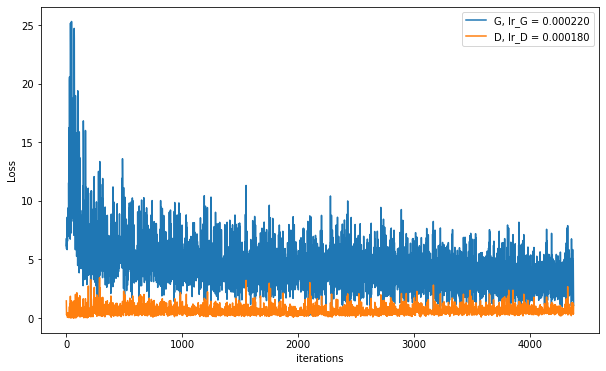

In [6]:
print("Starting Training Loop...")

import time
start = time.time()

# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later`
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding = 2, normalize = True))

        iters += 1
        
print ('compilation time : ', time.time() - start)
plt.figure(figsize=(10, 6))
plt.plot(G_losses,label = "G, lr_G = %f"%lr_G)
plt.plot(D_losses,label = "D, lr_D = %f"%lr_D)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

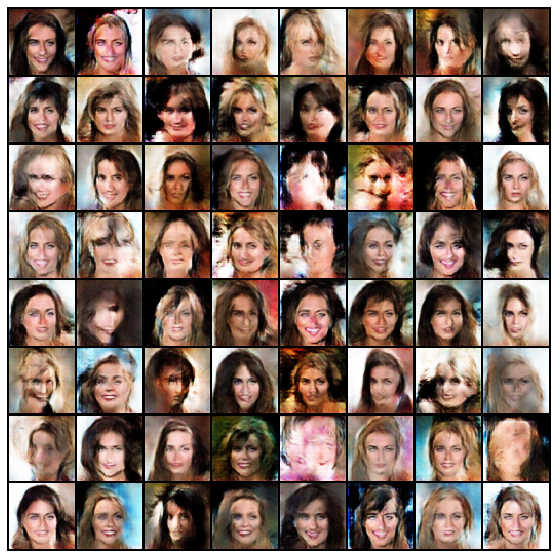

In [7]:
fig = plt.figure(figsize=(10, 10))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated = True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

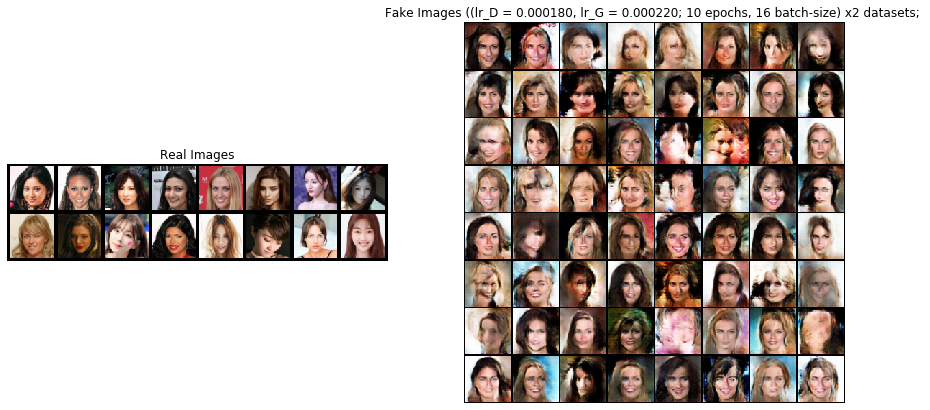

In [8]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[: 32], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images ((lr_D = %f, lr_G = %f; %d epochs, %d batch-size) x2 datasets; "
                        %(lr_D, lr_G, num_epochs, batch_size))
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

Now, we increase the new_parameters number of epoch = 200;

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


[14/200][200/219]	Loss_D: 0.1769	Loss_G: 5.5735	D(x): 0.8919	D(G(z)): 0.0248 / 0.0125
[15/200][0/219]	Loss_D: 0.6928	Loss_G: 5.2677	D(x): 0.6562	D(G(z)): 0.0202 / 0.0190
[15/200][50/219]	Loss_D: 0.6915	Loss_G: 3.0322	D(x): 0.6707	D(G(z)): 0.0390 / 0.1257
[15/200][100/219]	Loss_D: 0.1391	Loss_G: 5.3914	D(x): 0.9463	D(G(z)): 0.0596 / 0.0145
[15/200][150/219]	Loss_D: 0.0936	Loss_G: 5.7851	D(x): 0.9508	D(G(z)): 0.0251 / 0.0203
[15/200][200/219]	Loss_D: 0.4192	Loss_G: 4.9056	D(x): 0.9181	D(G(z)): 0.2303 / 0.0133
[16/200][0/219]	Loss_D: 1.4091	Loss_G: 9.3786	D(x): 0.9876	D(G(z)): 0.5771 / 0.0005
[16/200][50/219]	Loss_D: 0.2594	Loss_G: 5.2047	D(x): 0.9907	D(G(z)): 0.1773 / 0.0148
[16/200][100/219]	Loss_D: 0.2371	Loss_G: 5.8254	D(x): 0.9352	D(G(z)): 0.1090 / 0.0106
[16/200][150/219]	Loss_D: 0.1885	Loss_G: 4.8625	D(x): 0.9012	D(G(z)): 0.0508 / 0.0216
[16/200][200/219]	Loss_D: 0.1260	Loss_G: 5.7638	D(x): 0.9647	D(G(z)): 0.0576 / 0.0138
[17/200][0/219]	Loss_D: 0.0939	Loss_G: 6.5813	D(x): 0.9767	D

[34/200][0/219]	Loss_D: 0.2122	Loss_G: 4.2197	D(x): 0.9411	D(G(z)): 0.1144 / 0.0415
[34/200][50/219]	Loss_D: 0.1875	Loss_G: 5.8324	D(x): 0.8695	D(G(z)): 0.0281 / 0.0162
[34/200][100/219]	Loss_D: 0.6040	Loss_G: 4.3369	D(x): 0.7127	D(G(z)): 0.0190 / 0.0398
[34/200][150/219]	Loss_D: 0.4800	Loss_G: 3.7182	D(x): 0.7500	D(G(z)): 0.0795 / 0.0761
[34/200][200/219]	Loss_D: 0.1612	Loss_G: 4.4457	D(x): 0.9235	D(G(z)): 0.0657 / 0.0294
[35/200][0/219]	Loss_D: 0.3351	Loss_G: 3.9297	D(x): 0.8237	D(G(z)): 0.0817 / 0.0518
[35/200][50/219]	Loss_D: 0.3135	Loss_G: 5.4395	D(x): 0.8172	D(G(z)): 0.0241 / 0.0138
[35/200][100/219]	Loss_D: 0.0989	Loss_G: 4.1268	D(x): 0.9692	D(G(z)): 0.0593 / 0.0338
[35/200][150/219]	Loss_D: 0.1498	Loss_G: 7.1734	D(x): 0.9142	D(G(z)): 0.0374 / 0.0022
[35/200][200/219]	Loss_D: 0.1775	Loss_G: 4.8779	D(x): 0.9744	D(G(z)): 0.1141 / 0.0248
[36/200][0/219]	Loss_D: 0.2041	Loss_G: 3.7285	D(x): 0.9240	D(G(z)): 0.0742 / 0.0697
[36/200][50/219]	Loss_D: 0.2886	Loss_G: 4.1389	D(x): 0.8036	D(

[53/200][50/219]	Loss_D: 0.4443	Loss_G: 3.6635	D(x): 0.9491	D(G(z)): 0.2618 / 0.0498
[53/200][100/219]	Loss_D: 0.5510	Loss_G: 3.4095	D(x): 0.6850	D(G(z)): 0.0654 / 0.0681
[53/200][150/219]	Loss_D: 0.3376	Loss_G: 3.2499	D(x): 0.8267	D(G(z)): 0.0856 / 0.0979
[53/200][200/219]	Loss_D: 0.4396	Loss_G: 3.9660	D(x): 0.7559	D(G(z)): 0.0923 / 0.0491
[54/200][0/219]	Loss_D: 0.7857	Loss_G: 3.6055	D(x): 0.5983	D(G(z)): 0.0618 / 0.0703
[54/200][50/219]	Loss_D: 0.3310	Loss_G: 2.9485	D(x): 0.8090	D(G(z)): 0.0568 / 0.0989
[54/200][100/219]	Loss_D: 0.5871	Loss_G: 3.0110	D(x): 0.7283	D(G(z)): 0.1138 / 0.0983
[54/200][150/219]	Loss_D: 0.2804	Loss_G: 5.1954	D(x): 0.8056	D(G(z)): 0.0288 / 0.0155
[54/200][200/219]	Loss_D: 0.5049	Loss_G: 2.8463	D(x): 0.6793	D(G(z)): 0.0362 / 0.1020
[55/200][0/219]	Loss_D: 0.3547	Loss_G: 4.8892	D(x): 0.8842	D(G(z)): 0.1453 / 0.0214
[55/200][50/219]	Loss_D: 0.2461	Loss_G: 4.2617	D(x): 0.8870	D(G(z)): 0.0743 / 0.0505
[55/200][100/219]	Loss_D: 0.3553	Loss_G: 2.5530	D(x): 0.8570	

[72/200][100/219]	Loss_D: 0.1199	Loss_G: 4.3155	D(x): 0.9556	D(G(z)): 0.0666 / 0.0313
[72/200][150/219]	Loss_D: 0.3060	Loss_G: 3.1313	D(x): 0.8229	D(G(z)): 0.0640 / 0.0857
[72/200][200/219]	Loss_D: 0.2647	Loss_G: 4.3519	D(x): 0.9228	D(G(z)): 0.0832 / 0.0424
[73/200][0/219]	Loss_D: 0.1923	Loss_G: 4.7755	D(x): 0.9504	D(G(z)): 0.1097 / 0.0258
[73/200][50/219]	Loss_D: 0.1275	Loss_G: 3.5592	D(x): 0.9802	D(G(z)): 0.0875 / 0.0500
[73/200][100/219]	Loss_D: 0.5768	Loss_G: 4.3637	D(x): 0.9860	D(G(z)): 0.3508 / 0.0240
[73/200][150/219]	Loss_D: 0.2079	Loss_G: 4.1228	D(x): 0.8834	D(G(z)): 0.0655 / 0.0370
[73/200][200/219]	Loss_D: 0.1810	Loss_G: 3.8657	D(x): 0.9190	D(G(z)): 0.0782 / 0.0389
[74/200][0/219]	Loss_D: 0.1589	Loss_G: 5.8373	D(x): 0.8924	D(G(z)): 0.0124 / 0.0057
[74/200][50/219]	Loss_D: 0.0990	Loss_G: 4.2626	D(x): 0.9394	D(G(z)): 0.0315 / 0.0338
[74/200][100/219]	Loss_D: 0.6156	Loss_G: 3.5692	D(x): 0.6529	D(G(z)): 0.0472 / 0.0773
[74/200][150/219]	Loss_D: 0.2611	Loss_G: 2.8022	D(x): 0.9621

[91/200][150/219]	Loss_D: 0.2933	Loss_G: 2.6865	D(x): 0.9033	D(G(z)): 0.1389 / 0.1440
[91/200][200/219]	Loss_D: 0.4531	Loss_G: 3.2622	D(x): 0.7425	D(G(z)): 0.0686 / 0.1156
[92/200][0/219]	Loss_D: 0.1800	Loss_G: 2.3552	D(x): 0.9547	D(G(z)): 0.1046 / 0.1738
[92/200][50/219]	Loss_D: 0.1905	Loss_G: 6.8737	D(x): 0.9209	D(G(z)): 0.0755 / 0.0068
[92/200][100/219]	Loss_D: 0.4106	Loss_G: 5.5257	D(x): 0.9801	D(G(z)): 0.2257 / 0.0142
[92/200][150/219]	Loss_D: 0.2070	Loss_G: 4.9236	D(x): 0.9392	D(G(z)): 0.1139 / 0.0156
[92/200][200/219]	Loss_D: 0.1727	Loss_G: 4.5459	D(x): 0.9826	D(G(z)): 0.1187 / 0.0251
[93/200][0/219]	Loss_D: 0.1559	Loss_G: 3.6224	D(x): 0.9445	D(G(z)): 0.0775 / 0.0564
[93/200][50/219]	Loss_D: 0.0609	Loss_G: 5.4118	D(x): 0.9898	D(G(z)): 0.0416 / 0.0139
[93/200][100/219]	Loss_D: 0.1516	Loss_G: 4.8375	D(x): 0.9931	D(G(z)): 0.1168 / 0.0201
[93/200][150/219]	Loss_D: 0.1111	Loss_G: 5.4558	D(x): 0.9277	D(G(z)): 0.0281 / 0.0169
[93/200][200/219]	Loss_D: 0.0809	Loss_G: 4.7975	D(x): 0.9822

[110/200][200/219]	Loss_D: 0.0802	Loss_G: 5.8915	D(x): 0.9431	D(G(z)): 0.0169 / 0.0095
[111/200][0/219]	Loss_D: 0.0310	Loss_G: 6.7606	D(x): 0.9766	D(G(z)): 0.0065 / 0.0057
[111/200][50/219]	Loss_D: 0.1483	Loss_G: 4.7012	D(x): 0.9658	D(G(z)): 0.0900 / 0.0181
[111/200][100/219]	Loss_D: 0.0939	Loss_G: 5.2827	D(x): 0.9493	D(G(z)): 0.0329 / 0.0235
[111/200][150/219]	Loss_D: 0.0917	Loss_G: 3.8207	D(x): 0.9388	D(G(z)): 0.0201 / 0.0657
[111/200][200/219]	Loss_D: 0.1454	Loss_G: 4.9056	D(x): 0.9942	D(G(z)): 0.1016 / 0.0211
[112/200][0/219]	Loss_D: 0.0700	Loss_G: 3.7740	D(x): 0.9875	D(G(z)): 0.0511 / 0.0483
[112/200][50/219]	Loss_D: 0.0342	Loss_G: 7.6168	D(x): 0.9806	D(G(z)): 0.0130 / 0.0030
[112/200][100/219]	Loss_D: 0.2149	Loss_G: 4.7854	D(x): 0.8548	D(G(z)): 0.0328 / 0.0469
[112/200][150/219]	Loss_D: 0.1655	Loss_G: 4.8066	D(x): 0.9432	D(G(z)): 0.0826 / 0.0349
[112/200][200/219]	Loss_D: 0.2016	Loss_G: 5.2823	D(x): 0.8596	D(G(z)): 0.0168 / 0.0178
[113/200][0/219]	Loss_D: 0.6285	Loss_G: 1.4681	D(

[129/200][200/219]	Loss_D: 0.0274	Loss_G: 6.6592	D(x): 0.9821	D(G(z)): 0.0089 / 0.0042
[130/200][0/219]	Loss_D: 0.0086	Loss_G: 6.6163	D(x): 0.9986	D(G(z)): 0.0070 / 0.0055
[130/200][50/219]	Loss_D: 0.0272	Loss_G: 6.2154	D(x): 0.9854	D(G(z)): 0.0121 / 0.0066
[130/200][100/219]	Loss_D: 0.0257	Loss_G: 7.4738	D(x): 0.9801	D(G(z)): 0.0051 / 0.0017
[130/200][150/219]	Loss_D: 0.0351	Loss_G: 5.4869	D(x): 0.9933	D(G(z)): 0.0269 / 0.0135
[130/200][200/219]	Loss_D: 0.1784	Loss_G: 4.4213	D(x): 0.8575	D(G(z)): 0.0102 / 0.0374
[131/200][0/219]	Loss_D: 0.1301	Loss_G: 7.7589	D(x): 0.8894	D(G(z)): 0.0041 / 0.0028
[131/200][50/219]	Loss_D: 0.0799	Loss_G: 5.8729	D(x): 0.9695	D(G(z)): 0.0426 / 0.0113
[131/200][100/219]	Loss_D: 0.0412	Loss_G: 5.7519	D(x): 0.9925	D(G(z)): 0.0316 / 0.0080
[131/200][150/219]	Loss_D: 0.0257	Loss_G: 6.8084	D(x): 0.9848	D(G(z)): 0.0099 / 0.0029
[131/200][200/219]	Loss_D: 0.0353	Loss_G: 6.2106	D(x): 0.9927	D(G(z)): 0.0245 / 0.0098
[132/200][0/219]	Loss_D: 0.0289	Loss_G: 4.8640	D(

[148/200][200/219]	Loss_D: 0.0508	Loss_G: 6.2660	D(x): 0.9948	D(G(z)): 0.0413 / 0.0102
[149/200][0/219]	Loss_D: 0.0172	Loss_G: 7.1979	D(x): 0.9899	D(G(z)): 0.0069 / 0.0033
[149/200][50/219]	Loss_D: 0.0506	Loss_G: 5.5588	D(x): 0.9787	D(G(z)): 0.0270 / 0.0105
[149/200][100/219]	Loss_D: 0.0307	Loss_G: 6.2780	D(x): 0.9753	D(G(z)): 0.0048 / 0.0050
[149/200][150/219]	Loss_D: 0.0104	Loss_G: 4.8670	D(x): 0.9969	D(G(z)): 0.0071 / 0.0253
[149/200][200/219]	Loss_D: 0.0561	Loss_G: 5.0973	D(x): 0.9611	D(G(z)): 0.0103 / 0.0215
[150/200][0/219]	Loss_D: 0.0376	Loss_G: 5.6880	D(x): 0.9984	D(G(z)): 0.0341 / 0.0104
[150/200][50/219]	Loss_D: 0.1008	Loss_G: 5.9159	D(x): 0.9191	D(G(z)): 0.0080 / 0.0160
[150/200][100/219]	Loss_D: 0.0372	Loss_G: 9.0021	D(x): 0.9681	D(G(z)): 0.0034 / 0.0009
[150/200][150/219]	Loss_D: 0.0366	Loss_G: 6.5685	D(x): 0.9740	D(G(z)): 0.0089 / 0.0066
[150/200][200/219]	Loss_D: 0.0420	Loss_G: 7.7604	D(x): 0.9628	D(G(z)): 0.0019 / 0.0022
[151/200][0/219]	Loss_D: 0.0511	Loss_G: 6.4551	D(

[167/200][200/219]	Loss_D: 0.0465	Loss_G: 7.0786	D(x): 0.9592	D(G(z)): 0.0031 / 0.0038
[168/200][0/219]	Loss_D: 0.0351	Loss_G: 5.2777	D(x): 0.9932	D(G(z)): 0.0262 / 0.0349
[168/200][50/219]	Loss_D: 0.0500	Loss_G: 5.9476	D(x): 0.9952	D(G(z)): 0.0416 / 0.0100
[168/200][100/219]	Loss_D: 0.0436	Loss_G: 5.9625	D(x): 0.9712	D(G(z)): 0.0111 / 0.0152
[168/200][150/219]	Loss_D: 0.0829	Loss_G: 8.2451	D(x): 0.9296	D(G(z)): 0.0025 / 0.0024
[168/200][200/219]	Loss_D: 0.0631	Loss_G: 6.0423	D(x): 0.9674	D(G(z)): 0.0101 / 0.0101
[169/200][0/219]	Loss_D: 0.0150	Loss_G: 6.9794	D(x): 0.9984	D(G(z)): 0.0129 / 0.0072
[169/200][50/219]	Loss_D: 0.0937	Loss_G: 6.0099	D(x): 0.9946	D(G(z)): 0.0721 / 0.0064
[169/200][100/219]	Loss_D: 0.0859	Loss_G: 6.2570	D(x): 0.9956	D(G(z)): 0.0537 / 0.0110
[169/200][150/219]	Loss_D: 0.0333	Loss_G: 5.0834	D(x): 0.9927	D(G(z)): 0.0241 / 0.0213
[169/200][200/219]	Loss_D: 0.0115	Loss_G: 7.0062	D(x): 0.9965	D(G(z)): 0.0077 / 0.0030
[170/200][0/219]	Loss_D: 0.0209	Loss_G: 5.8096	D(

[186/200][200/219]	Loss_D: 0.0137	Loss_G: 6.5271	D(x): 0.9972	D(G(z)): 0.0106 / 0.0050
[187/200][0/219]	Loss_D: 0.0168	Loss_G: 6.3851	D(x): 0.9946	D(G(z)): 0.0110 / 0.0057
[187/200][50/219]	Loss_D: 0.0281	Loss_G: 5.9203	D(x): 0.9892	D(G(z)): 0.0160 / 0.0125
[187/200][100/219]	Loss_D: 0.0197	Loss_G: 6.6411	D(x): 0.9970	D(G(z)): 0.0158 / 0.0073
[187/200][150/219]	Loss_D: 0.1236	Loss_G: 5.9923	D(x): 0.9997	D(G(z)): 0.0903 / 0.0070
[187/200][200/219]	Loss_D: 0.8795	Loss_G: 5.3593	D(x): 0.7161	D(G(z)): 0.0511 / 0.0551
[188/200][0/219]	Loss_D: 0.2257	Loss_G: 6.8805	D(x): 0.9342	D(G(z)): 0.0972 / 0.0088
[188/200][50/219]	Loss_D: 0.0833	Loss_G: 8.2621	D(x): 0.9591	D(G(z)): 0.0330 / 0.0032
[188/200][100/219]	Loss_D: 0.2767	Loss_G: 6.1131	D(x): 0.8133	D(G(z)): 0.0044 / 0.0092
[188/200][150/219]	Loss_D: 0.1320	Loss_G: 6.6345	D(x): 0.9161	D(G(z)): 0.0264 / 0.0151
[188/200][200/219]	Loss_D: 0.0309	Loss_G: 6.4615	D(x): 0.9837	D(G(z)): 0.0135 / 0.0119
[189/200][0/219]	Loss_D: 0.0339	Loss_G: 6.1368	D(

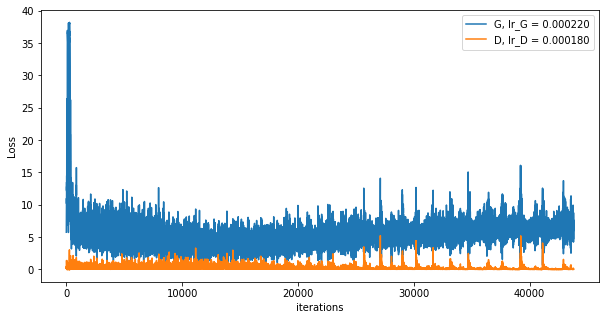

In [9]:
num_epochs = 200   
lr_D, lr_G = 0.00015, 0.00025
batch_size = 32
beta1 = 0.8

dataloader = torch.utils.data.DataLoader(dataset, batch_size = batch_size,
                                         shuffle = True, num_workers=workers)

real_batch = next(iter(dataloader))
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)
    
netG = Generator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

netG.apply(weights_init)

print(netG)

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)    

netD = Discriminator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

netD.apply(weights_init)

print(netD)

criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr=lr_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr_G, betas=(beta1, 0.999))

img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")

import time
start = time.time()

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
print ('compilation time : ', time.time() - start)
plt.figure(figsize=(10, 5))

plt.plot(G_losses,label="G, lr_G = %f"%lr_G)
plt.plot(D_losses,label="D, lr_D = %f"%lr_D)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Animation size has reached 21742128 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


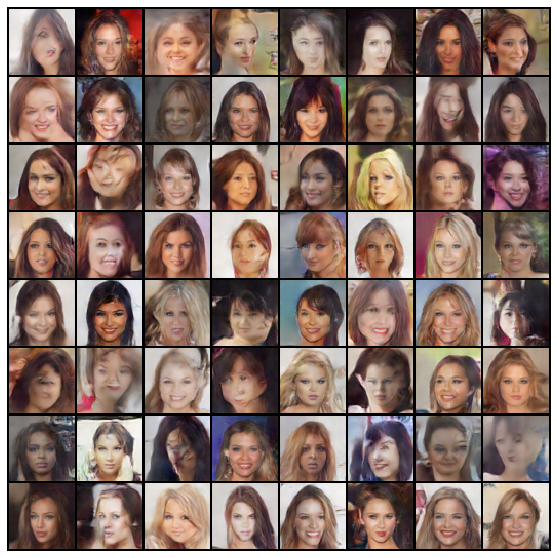

In [10]:
fig = plt.figure(figsize=(10, 10))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated = True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval = 1000, repeat_delay = 1000, blit = True)
HTML(ani.to_jshtml())
real_batch = next(iter(dataloader))

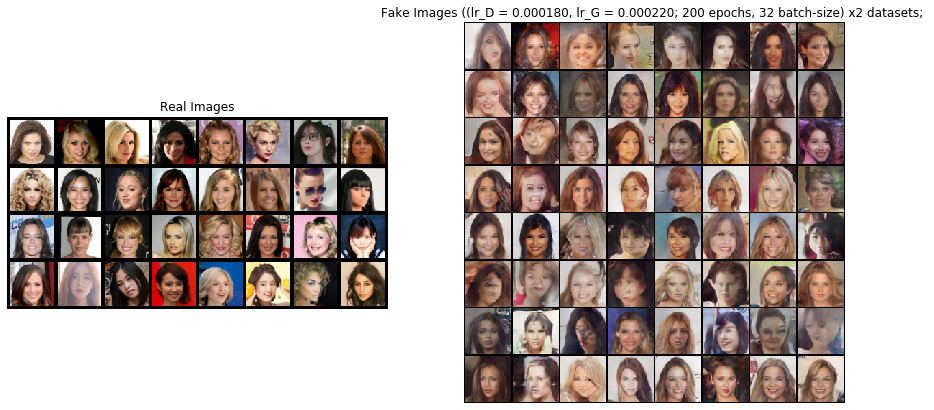

In [11]:
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:32], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images ((lr_D = %f, lr_G = %f; %d epochs, %d batch-size) x2 datasets; "
                        %(lr_D, lr_G, num_epochs, batch_size))
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()